In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import yaml

config = yaml.load(open('../config/full_images_to_hist_config.yaml', 'r'), Loader=yaml.FullLoader)
n_bins = config['clusterization_config']['n_clusters']

In [2]:
df = pd.read_csv('../dataset/final_histograms.csv')
df

,image_name,features_histogram,features_CNN,class,features_fusion
0,0_430b273cb7915d83.jpg,[0.00891516 0.01386802 0.00924535 0.00891516 0...,"[0.029053611680865288, 0.005296911112964153, 0...",0_type1,"[-2.613821145742236, 2.587963542480173, -0.439..."
1,0_8c54ccf63a12ee74.jpg,[0.01114108 0.00788027 0.00652161 0.00679334 0...,"[0.024662550538778305, 0.0006535819848068058, ...",0_type1,"[-2.5640103286492733, 4.1776568101211105, -0.2..."
2,0_c8f198d7da690cc8.jpg,[0.00954264 0.0126586 0.0085689 0.00837415 0...,"[0.026438146829605103, 0.0029341084882616997, ...",0_type1,"[-3.9845652390666073, 3.9972214919772657, 0.33..."
3,100001.jpg,[0.00292408 0.00988136 0.0033274 0.00846974 0...,"[0.029428591951727867, 0.005259289871901274, 0...",0_type2,"[-2.384346915456419, 8.250267666349039, -5.056..."
4,1000_nm1265067_rm1814797056_1975-7-6_2006.jpg,[0.0123984 0. 0.0247968 0. 0...,"[0.01161122415214777, 0.0074028559029102325, 0...",1000_type1,"[1.1109833935081854, -3.3930054641721537, -0.5..."
...,...,...,...,...,...
13486,9_2880a8b6f793718b.jpg,[0.00515493 0.01153723 0.00957345 0.00589135 0...,"[0.024701157584786415, 0.0011192563688382506, ...",9_type1,"[-2.7867420816539648, 0.48772546549633866, 2.3..."
13487,9_3132ef918ba51ab2.jpg,[0.0041328 0.0078064 0.006888 0.0032144 0...,"[0.01882963255047798, 0.0005661462782882154, 0...",9_type1,"[-2.681220559536008, 1.113189140870911, 2.8531..."
13488,9_a375246edbdf075f.jpg,[0.00558239 0.00580569 0.01272785 0.00491251 0...,"[0.015856489539146423, 0.001510198344476521, 0...",9_type1,"[-3.7070877487107743, 0.9821294784843366, 2.68..."
13489,9_ae96695dd68be0b5.jpg,[0.00671726 0.01200965 0.01139899 0.00732792 0...,"[0.01761815883219242, 0.0004240881244186312, 0...",9_type1,"[-1.230852193697406, 0.8451719463056238, 1.915..."


In [13]:
df

,image_name,features_histogram,features_CNN,class,features_fusion
0,0_430b273cb7915d83.jpg,[0.00891516 0.01386802 0.00924535 0.00891516 0...,"[0.029053611680865288, 0.005296911112964153, 0...",0_type1,"[-2.613821145742236, 2.587963542480173, -0.439..."
1,0_8c54ccf63a12ee74.jpg,[0.01114108 0.00788027 0.00652161 0.00679334 0...,"[0.024662550538778305, 0.0006535819848068058, ...",0_type1,"[-2.5640103286492733, 4.1776568101211105, -0.2..."
2,0_c8f198d7da690cc8.jpg,[0.00954264 0.0126586 0.0085689 0.00837415 0...,"[0.026438146829605103, 0.0029341084882616997, ...",0_type1,"[-3.9845652390666073, 3.9972214919772657, 0.33..."
3,100001.jpg,[0.00292408 0.00988136 0.0033274 0.00846974 0...,"[0.029428591951727867, 0.005259289871901274, 0...",0_type2,"[-2.384346915456419, 8.250267666349039, -5.056..."
4,1000_nm1265067_rm1814797056_1975-7-6_2006.jpg,[0.0123984 0. 0.0247968 0. 0...,"[0.01161122415214777, 0.0074028559029102325, 0...",1000_type1,"[1.1109833935081854, -3.3930054641721537, -0.5..."
...,...,...,...,...,...
13486,9_2880a8b6f793718b.jpg,[0.00515493 0.01153723 0.00957345 0.00589135 0...,"[0.024701157584786415, 0.0011192563688382506, ...",9_type1,"[-2.7867420816539648, 0.48772546549633866, 2.3..."
13487,9_3132ef918ba51ab2.jpg,[0.0041328 0.0078064 0.006888 0.0032144 0...,"[0.01882963255047798, 0.0005661462782882154, 0...",9_type1,"[-2.681220559536008, 1.113189140870911, 2.8531..."
13488,9_a375246edbdf075f.jpg,[0.00558239 0.00580569 0.01272785 0.00491251 0...,"[0.015856489539146423, 0.001510198344476521, 0...",9_type1,"[-3.7070877487107743, 0.9821294784843366, 2.68..."
13489,9_ae96695dd68be0b5.jpg,[0.00671726 0.01200965 0.01139899 0.00732792 0...,"[0.01761815883219242, 0.0004240881244186312, 0...",9_type1,"[-1.230852193697406, 0.8451719463056238, 1.915..."


In [3]:
def get_hist_from_str(value, separator):
    hist = str(value).strip().replace('[','').replace(']','').replace("\n","").split(separator)
    hist = [i for i in hist if i != '']
    hist = np.array(hist, dtype=np.float32)
    return hist

In [4]:
def get_hist(value):
    hist = str(value).strip().replace('[','').replace(']','').replace("\n","").split(" ")
    hist = [i for i in hist if i != '']
    hist = np.array(hist, dtype=np.float32)
    return hist

In [9]:
def plot_histogram(df, index):
    hist = get_hist(df["features_histogram"][index])
    x = np.arange(0, n_bins)
    plt.bar(x, hist)
    plt.title("Histogram")
    plt.xlabel("Quantized Value")
    plt.ylabel("Frequency")
    plt.show()


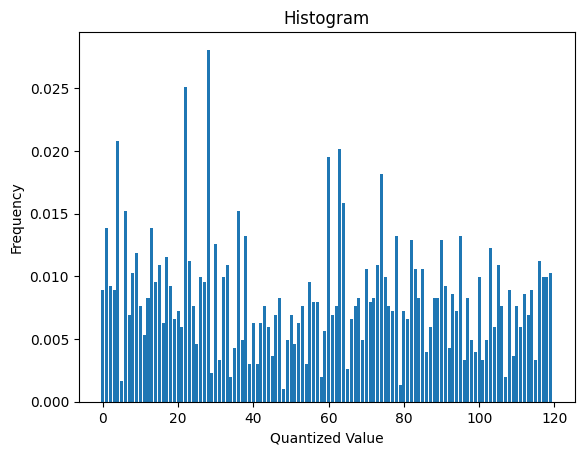

In [10]:
plot_histogram(df, 0)

In [11]:
def similarity_metric(vec_1,vec_2, measure = 'euclidean'):
    if measure == 'euclidean':
        resta = vec_1 - vec_2
        return np.sqrt(np.sum(resta**2))
    elif measure == 'manhattan':
        resta = vec_1 - vec_2
        return np.sum(np.abs(resta))
    elif measure == 'cosine':
        dot_product = np.dot(vec_1, vec_2)
        norm_a = np.linalg.norm(vec_1)
        norm_b = np.linalg.norm(vec_2)
        cosine_similarity = dot_product / (norm_a * norm_b)
        return 1 - cosine_similarity
    else:
        raise ValueError(f"Unknown measure: {measure}")

In [12]:
# import module from other directory
import sys
sys.path.insert(1, '../')

from src.SIFT.SIFT_gen_and_utils import SIFTFeatures

SIFT = SIFTFeatures("", "", run=False)
# image_example = df["image_name"][999]
# image_class = SIFT.get_class(image_example)
# image_class

In [14]:
# get all images from the same class
#df["class"] = df["image_name"].apply(lambda x: SIFT.get_class(x))

# rename histogram column to features_histogram
#df = df.rename(columns={"histogram": "features_histogram"})
df["features_histogram"] = df["features_histogram"].apply(lambda x: get_hist(x))

df["features_CNN"] = df["features_CNN"].apply(lambda x: get_hist_from_str(x, ","))

df["features_fusion"] = df["features_fusion"].apply(lambda x: get_hist_from_str(x, ","))


In [15]:
df

,image_name,features_histogram,features_CNN,class,features_fusion
0,0_430b273cb7915d83.jpg,"[0.00891516, 0.01386802, 0.00924535, 0.0089151...","[0.029053612, 0.005296911, 0.04431615, 8.36852...",0_type1,"[-2.613821, 2.5879636, -0.439339, 2.8203344, -..."
1,0_8c54ccf63a12ee74.jpg,"[0.01114108, 0.00788027, 0.00652161, 0.0067933...","[0.02466255, 0.000653582, 0.028425196, 0.00015...",0_type1,"[-2.5640104, 4.1776567, -0.21925291, 3.9206932..."
2,0_c8f198d7da690cc8.jpg,"[0.00954264, 0.0126586, 0.0085689, 0.00837415,...","[0.026438147, 0.0029341085, 0.03634543, -0.002...",0_type1,"[-3.9845653, 3.9972215, 0.3327795, 3.722962, -..."
3,100001.jpg,"[0.00292408, 0.00988136, 0.0033274, 0.00846974...","[0.029428592, 0.00525929, 0.044686396, 0.00075...",0_type2,"[-2.384347, 8.250268, -5.0563407, 1.9596149, -..."
4,1000_nm1265067_rm1814797056_1975-7-6_2006.jpg,"[0.0123984, 0.0, 0.0247968, 0.0, 0.0, 0.004132...","[0.011611224, 0.007402856, 0.045435827, -0.002...",1000_type1,"[1.1109834, -3.3930054, -0.5205819, 1.758669, ..."
...,...,...,...,...,...
13486,9_2880a8b6f793718b.jpg,"[0.00515493, 0.01153723, 0.00957345, 0.0058913...","[0.024701158, 0.0011192564, 0.022922888, -0.00...",9_type1,"[-2.786742, 0.48772547, 2.315715, -0.05222658,..."
13487,9_3132ef918ba51ab2.jpg,"[0.0041328, 0.0078064, 0.006888, 0.0032144, 0....","[0.018829633, 0.0005661463, 0.01457021, -0.005...",9_type1,"[-2.6812205, 1.1131891, 2.853166, 0.09243877, ..."
13488,9_a375246edbdf075f.jpg,"[0.00558239, 0.00580569, 0.01272785, 0.0049125...","[0.01585649, 0.0015101983, 0.0134944385, -0.00...",9_type1,"[-3.7070878, 0.98212945, 2.6839945, -1.6202887..."
13489,9_ae96695dd68be0b5.jpg,"[0.00671726, 0.01200965, 0.01139899, 0.0073279...","[0.017618159, 0.00042408812, 0.013445612, -0.0...",9_type1,"[-1.2308522, 0.8451719, 1.915651, 0.015826508,..."


In [37]:
import tqdm
# create a similarity matrix for each image
def similarity_matrix(df, measure="cosine", feature_type = "histogram"):
    # create a matrix of zeros
    similarity_matrix = np.zeros((len(df), len(df)))
    # iterate over each image
    for i in tqdm.tqdm(range(len(df))):
        # get the image name
        image_name = df["image_name"][i]
        # calculate the similarity with the rest of images
        for j in range(len(df)):
            # get the image name
            image_name_2 = df["image_name"][j]
            if similarity_matrix[j,i] != 0:
                similarity_matrix[i, j] = similarity_matrix[j,i]
                continue
            if image_name == image_name_2:
                similarity_matrix[i, j] = 0
                continue
            # calculate the similarity
            similarity_matrix[i, j] = similarity_metric(df[f"features_{feature_type}"][i], df[f"features_{feature_type}"][j], measure=measure)
    return similarity_matrix

matrix = similarity_matrix(df, measure="cosine", feature_type = "histogram")
matrix_cnn = similarity_matrix(df, measure="cosine", feature_type = "CNN")
#matrix_fusion = similarity_matrix(df, measure="cosine", feature_type = "fusion")

  0%|          | 0/13491 [00:00<?, ?it/s]/tmp/ipykernel_22462/567667725.py:12: RuntimeWarning: invalid value encountered in float_scalars
  cosine_similarity = dot_product / (norm_a * norm_b)
100%|██████████| 13491/13491 [26:42<00:00,  8.42it/s]


In [38]:
import joblib
joblib.dump(matrix, "../dataset/similarity_matrix_histogram.pkl")
joblib.dump(matrix_cnn, "../dataset/similarity_matrix_cnn.pkl")
#joblib.dump(matrix_fusion, "../dataset/similarity_matrix_fusion.pkl")
#matrix_fusion

['../dataset/similarity_matrix_cnn.pkl']

In [18]:
import joblib
matrix = joblib.load("../dataset/similarity_matrix_histogram.pkl")
matrix

array([[0.        , 0.06628722, 0.05987192, ..., 0.06196955, 0.03750617,
        0.05437732],
       [0.06628722, 0.        , 0.02919658, ..., 0.07483669, 0.05703997,
        0.05590313],
       [0.05987192, 0.02919658, 0.        , ..., 0.06800602, 0.04971512,
        0.04724106],
       ...,
       [0.06196955, 0.07483669, 0.06800602, ..., 0.        , 0.04553069,
        0.03771284],
       [0.03750617, 0.05703997, 0.04971512, ..., 0.04553069, 0.        ,
        0.03397393],
       [0.05437732, 0.05590313, 0.04724106, ..., 0.03771284, 0.03397393,
        0.        ]])

In [19]:
matrix_cnn = joblib.load("../dataset/similarity_matrix_CNN.pkl")
matrix_cnn

array([[0.        , 0.57635069, 0.28857875, ..., 0.76624221, 0.76619613,
        0.86151338],
       [0.57635069, 0.        , 0.34135759, ..., 0.37636894, 0.41639376,
        0.46754754],
       [0.28857875, 0.34135759, 0.        , ..., 0.52462089, 0.53274268,
        0.62273628],
       ...,
       [0.76624221, 0.37636894, 0.52462089, ..., 0.        , 0.18313505,
        0.18712464],
       [0.76619613, 0.41639376, 0.53274268, ..., 0.18313505, 0.        ,
        0.18633606],
       [0.86151338, 0.46754754, 0.62273628, ..., 0.18712464, 0.18633606,
        0.        ]])

In [20]:
def query_image_normal(df_, image_name, measure="cosine", feature_type = "CNN"):
    df_["similarity"] = df_[f"features_{feature_type}"].apply(lambda x: similarity_metric(x, df[df["image_name"] == image_name][f"features_{feature_type}"].values[0], measure=measure))
    df_ = df_.sort_values(by=['similarity'])
    df_ = df_.reset_index(drop=True)
    return df_

In [21]:
def query_image(df_, matrix_, query_image_):
    # get the index of the query image
    index = df_[df_["image_name"] == query_image_].index.values[0]
    # get the similarity vector
    similarity_vector = matrix_[index]
    # create a dataframe
    df_query_ = pd.DataFrame({"image_name": df_["image_name"], "similarity": similarity_vector, "class": df_["class"]})
    # sort the dataframe
    df_query_ = df_query_.sort_values(by=['similarity'])
    df_query_ = df_query_.reset_index(drop=True)
    return df_query_


In [29]:
image_example = df["image_name"][10000]
df_query = query_image(df, matrix, image_example)
df_query

,image_name,similarity,class
0,51_7d5624a4eabc15aa.jpg,0.000000,51_type1
1,51_eee512f48624b753.jpg,0.027298,51_type1
2,51_29bcbe9f45f4d7c3.jpg,0.028686,51_type1
3,51_ed35525218a6a1e1.jpg,0.029725,51_type1
4,51_58b9a408e355e46d.jpg,0.030854,51_type1
...,...,...,...
13486,125802.jpg,0.935711,258_type2
13487,127403.jpg,1.067419,274_type2
13488,125800.jpg,1.153356,258_type2
13489,127400.jpg,1.344435,274_type2


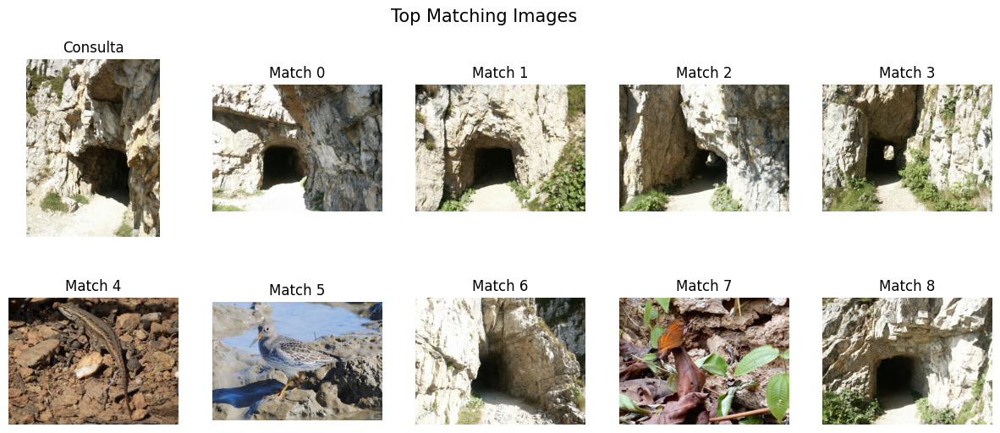

In [30]:
from PIL import Image
def plot_10(df_, path_to_images):
    fig,ax = plt.subplots(nrows=2,ncols=5,figsize=(15, 6))
    fig.suptitle("Top Matching Images", fontsize=15)
    ax[0][0].set_title(f"Consulta")
    x = 0
    for j in range(0, 2):
        for i in range(0,5):
            ax[j][i].set_axis_off()
            ax[j][i].imshow(Image.open(f'{path_to_images}/{df_["image_name"][x]}'))
            if x > 0:
                ax[j][i].set_title(f"Match {x-1}")
            x +=1
    plt.show()

path_to_images = '/mnt/c/Users/pyanez/Desktop/pablo/universidad/LabInt/dataset/total'
plot_10(df_query,path_to_images)

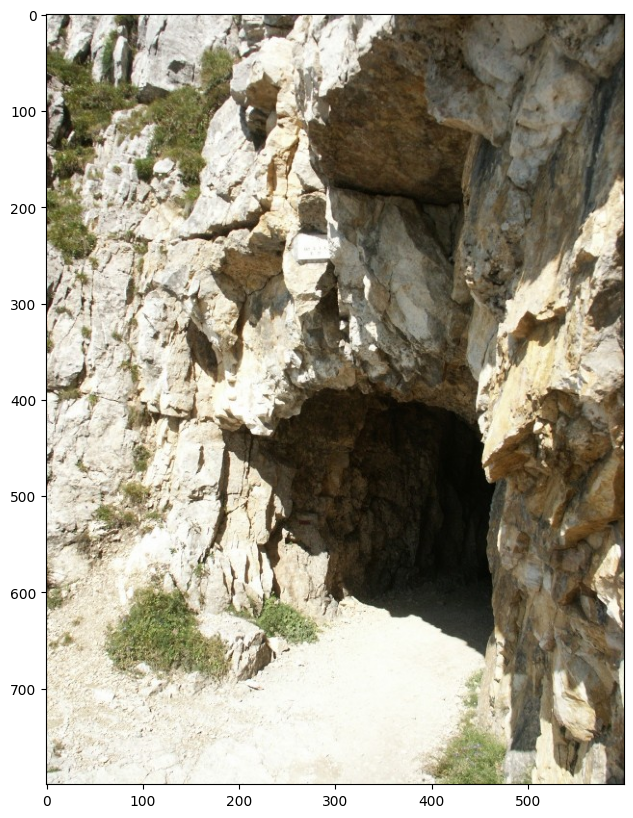

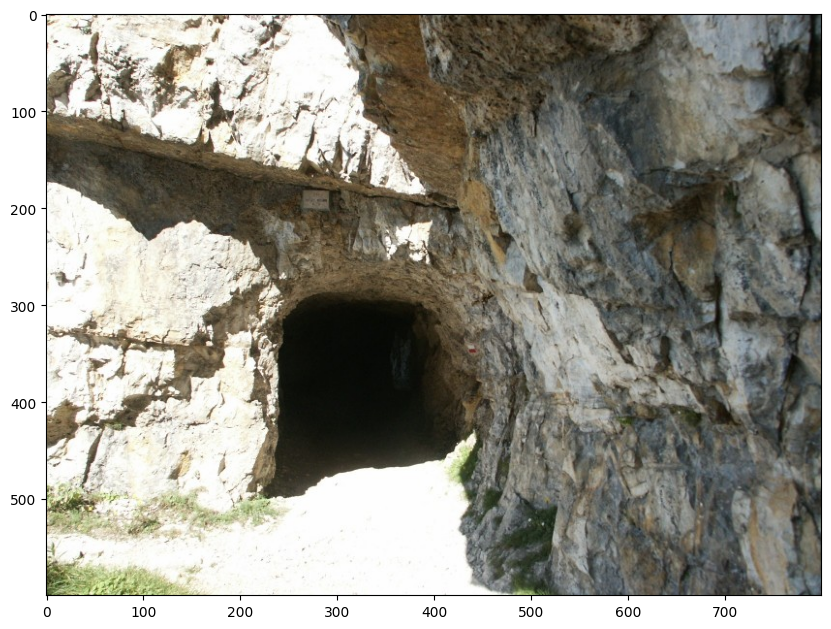

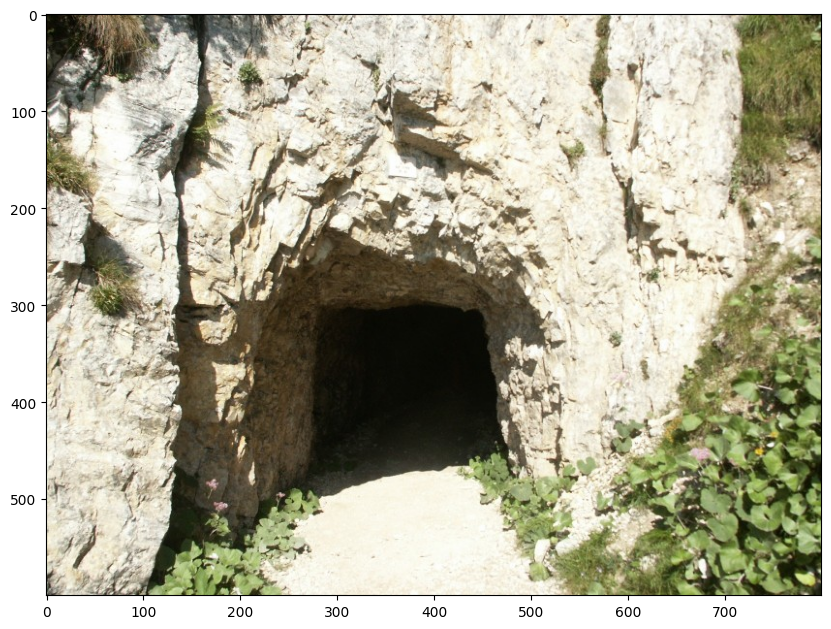

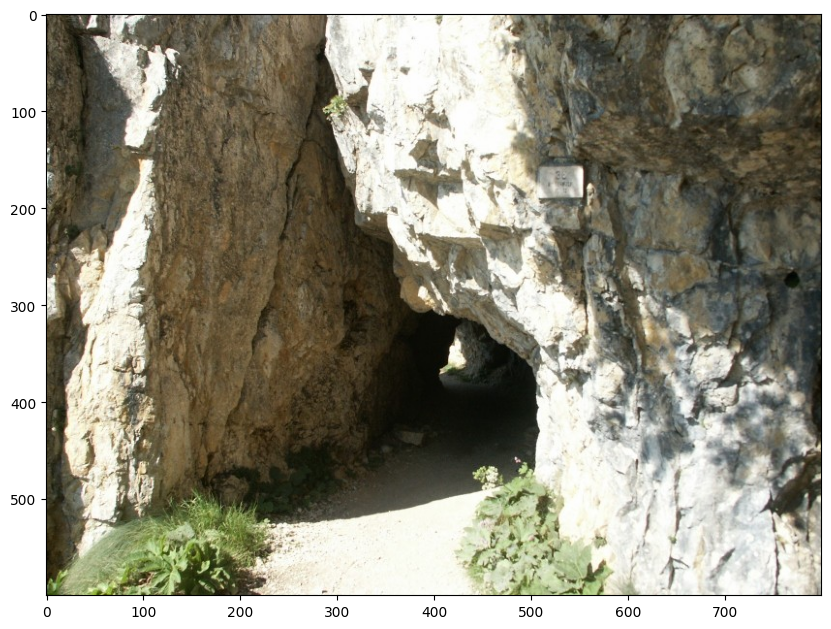

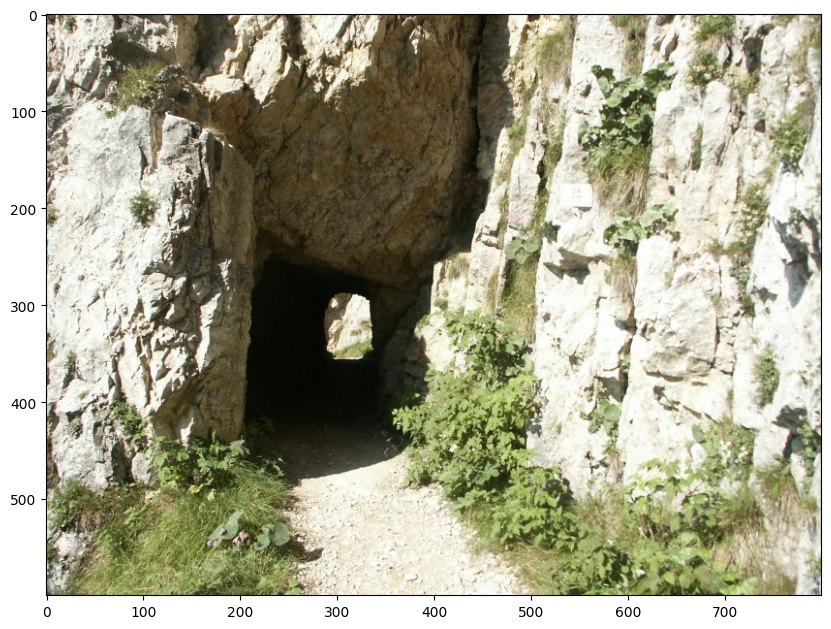

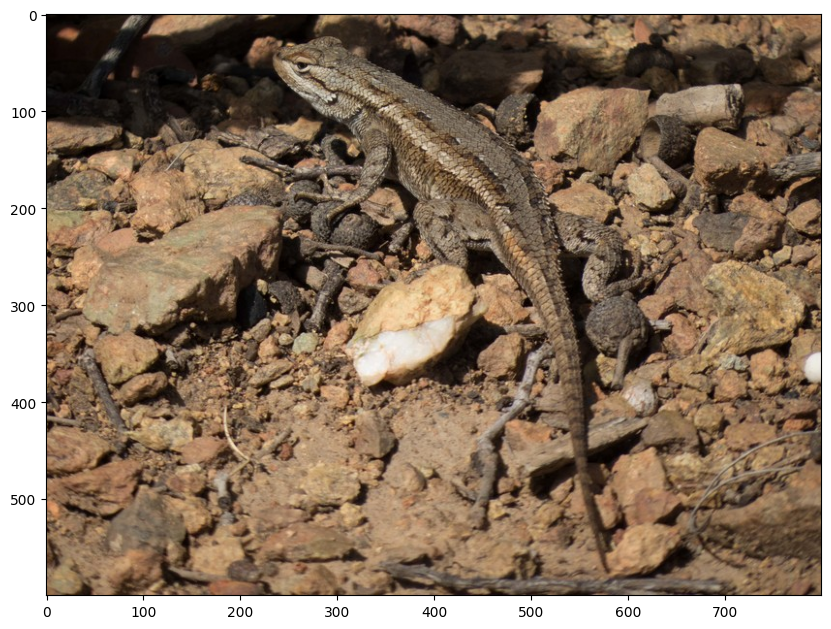

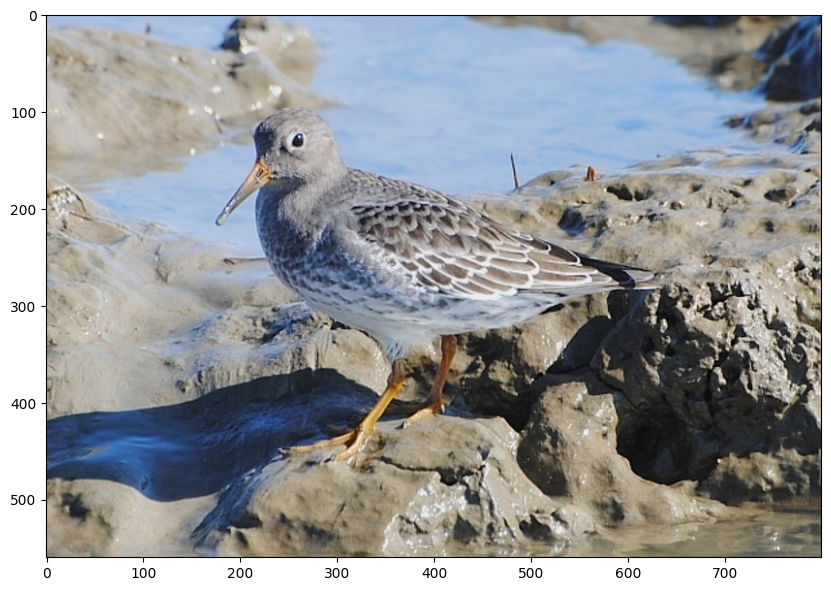

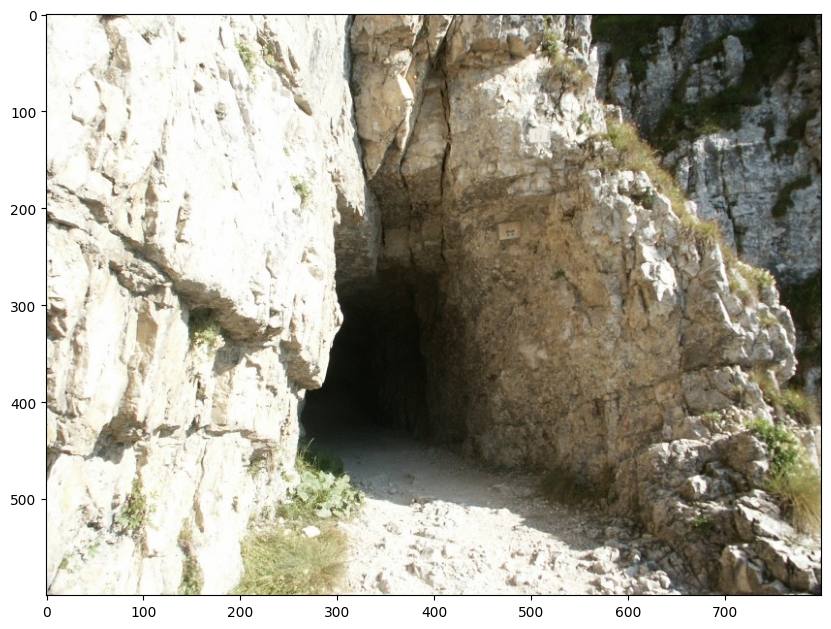

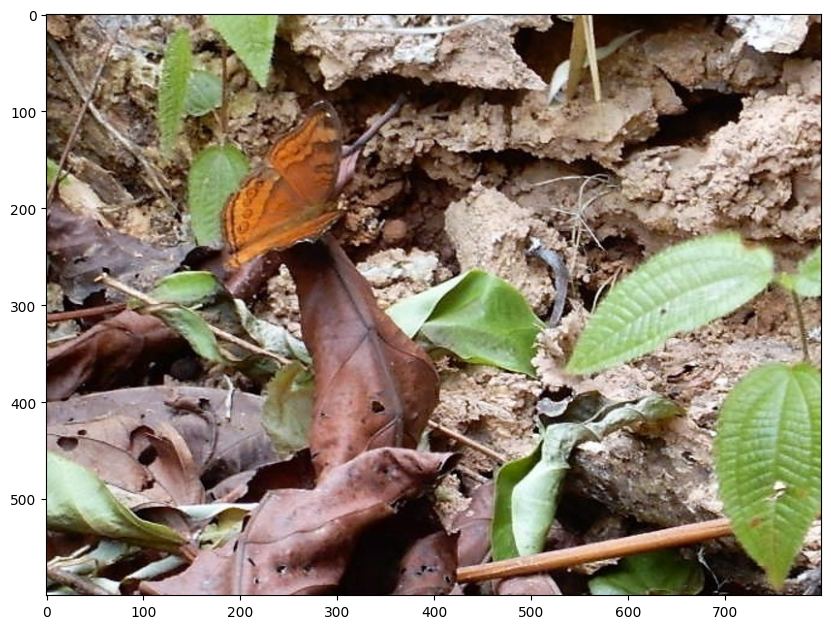

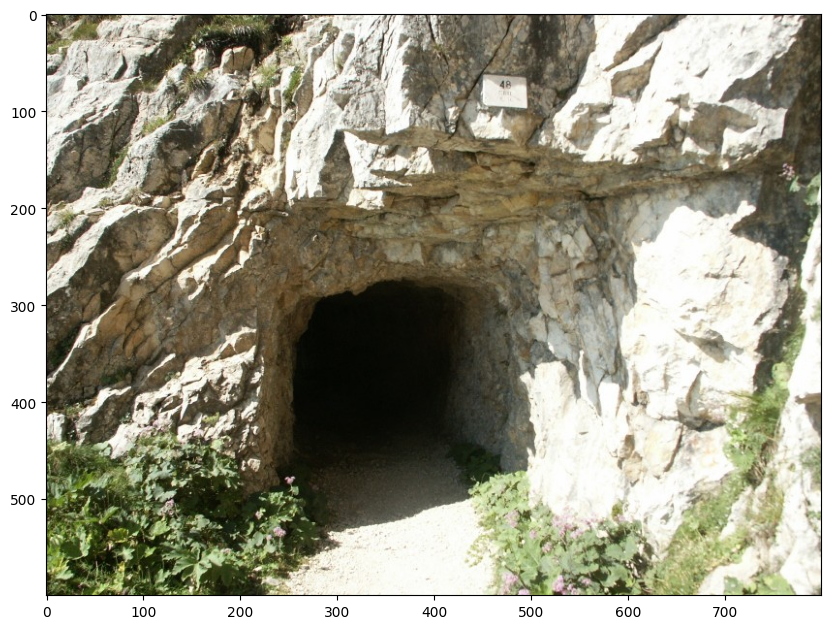

In [31]:
# plot the most similar images
from PIL import Image
def plot_images(df_, index):
    plt.figure(figsize=(10, 10))
    plt.imshow(Image.open(f'../dataset/total/{df_["image_name"][index]}'))
    plt.show()


for i in range(0, 10):
    #print(df["similarity"][i])
    #print(df["image_name"][i])
    plot_images(df_query, i)


In [22]:
# count how many different classes are
df["class"].nunique()

1700

In [24]:
# evaluating ranking method
def evaluate_query(df, matrix_, image_query, normalized=True):
    # obtener la clase de la imagen
    image_class_ = SIFT.get_class(image_query)
    #print(image_class)
    # calcular similudes
    df_query_ = query_image(df, matrix_, image_query)
    #print(df.columns)
    # obtener los indices de las imagenes de la misma clase
    indexes = df_query_[df_query_["class"] == image_class_].index.values.tolist()
    #print(indexes)
    n_rel = len(indexes) - 1

    if normalized:
        NT = len(df)
        return 1/(n_rel*NT) * (sum(indexes) - (n_rel*(n_rel+1))/2)

    return 1/n_rel * sum(indexes)

image_example = df["image_name"][0]
evaluate_query(df, matrix, image_example, normalized=True)


0.06501453643993116

100%|██████████| 13491/13491 [00:50<00:00, 268.84it/s]


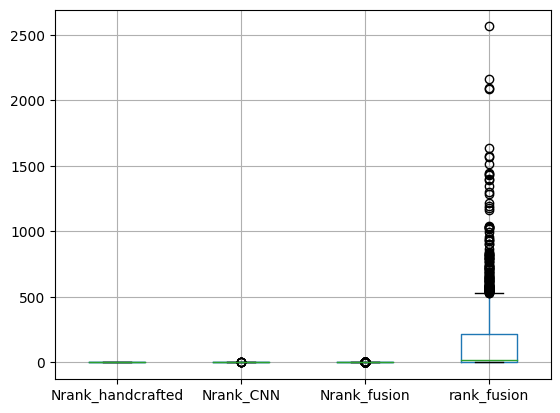

In [35]:
import tqdm
for i in tqdm.tqdm(range(len(df))):
    row = df.iloc[i,:]
    df.loc[i, "rank_handcrafted"] = evaluate_query(df, matrix, row["image_name"], normalized=False)

for i in tqdm.tqdm(range(len(df))):
    row = df.iloc[i,:]
    df.loc[i, "rank_CNN"] = evaluate_query(df, matrix_cnn, row["image_name"], normalized=False)

for i in tqdm.tqdm(range(len(df))):
    row = df.iloc[i,:]
    df.loc[i, "rank_fusion"] = evaluate_query(df, matrix_fusion, row["image_name"], normalized=False)

# drop non numeric columns
df_grouped = df.drop(["image_name"], axis=1)
# group by class
df_grouped = df_grouped.groupby("class").mean()
# generate a box plot for each column
df_grouped.boxplot()
plt.show()

In [36]:
df_grouped.describe()

,Nrank_handcrafted,Nrank_CNN,Nrank_fusion,rank_fusion
count,1700.000000,1700.000000,1700.000000,1700.000000
mean,0.287989,0.206808,0.010528,145.996183
std,0.233920,0.138689,0.018739,253.381632
min,0.000000,0.000000,0.000000,1.000000
25%,0.059908,0.092937,0.000000,2.500000
50%,0.264273,0.195998,0.000719,14.505556
75%,0.464339,0.302527,0.015413,212.938889
max,0.999580,0.743496,0.189584,2562.677778


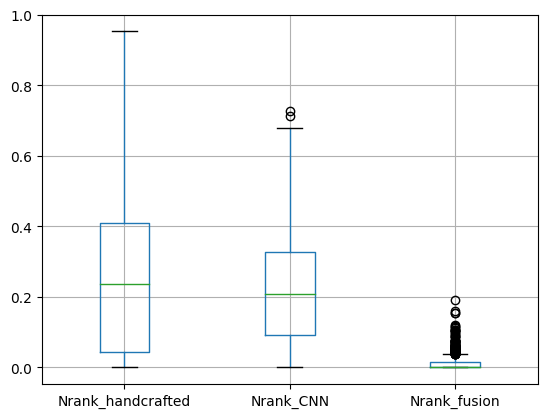

In [49]:
# import tqdm
# for i in tqdm.tqdm(range(len(df))):
#     row = df.iloc[i,:]
#     df.loc[i, "Nrank_handcrafted"] = evaluate_query(df, matrix, row["image_name"], normalized=True)
#
# for i in tqdm.tqdm(range(len(df))):
#     row = df.iloc[i,:]
#     df.loc[i, "Nrank_CNN"] = evaluate_query(df, matrix_cnn, row["image_name"], normalized=True)

# for i in tqdm.tqdm(range(len(df))):
#     row = df.iloc[i,:]
#     df.loc[i, "Nrank_fusion"] = evaluate_query(df, matrix_fusion, row["image_name"], normalized=True)

# drop non numeric columns
df_grouped = df.drop(["image_name", "rank_fusion"], axis=1)
# group by class
df_grouped = df_grouped.groupby("class").mean()
# generate a box plot for each column
df_grouped.boxplot()
plt.show()


In [50]:
df_grouped.describe()

,Nrank_handcrafted,Nrank_CNN,Nrank_fusion
count,1700.000000,1700.000000,1700.000000
mean,0.250358,0.219112,0.010528
std,0.207071,0.145630,0.018739
min,0.000000,0.000000,0.000000
25%,0.042617,0.092718,0.000000
50%,0.236284,0.208175,0.000719
75%,0.409270,0.327979,0.015413
max,0.952783,0.726657,0.189584


In [27]:
# get the class with more elements
df["class"].value_counts().median()

10.0

In [32]:
# calculate precision and recall
def precision_recall(df, matrix_, image_query, n_retrieved=10):
    # obtener la clase de la imagen
    image_class = SIFT.get_class(image_query)
    #print(image_class)
    # calcular similudes
    df_query_ = query_image(df, matrix_, image_query)
    #print(df_query)
    #print(df.columns)
    #N_rel = len(df_query[df_query["class"] == image_class])
    #print(N_rel)
    # get the top 10 images
    top_10 = df_query_.iloc[1:n_retrieved+1,:]
    # calculate TP
    TP = len(top_10[top_10["class"] == image_class])
    # calculate FP
    FP = len(top_10[top_10["class"] != image_class])
    # calculate FN
    FN = len(df_query_[df_query_["class"] == image_class]) - TP - 1

    #print(TP, FP, FN)
    # calculate precision
    precision_res = TP/(TP+FP)
    # calculate recall
    recall_res = TP/(TP+FN)
    return precision_res, recall_res

image_example = df["image_name"][0]
precision_recall(df, matrix_fusion, image_example, n_retrieved=100)


(0.08, 0.8888888888888888)

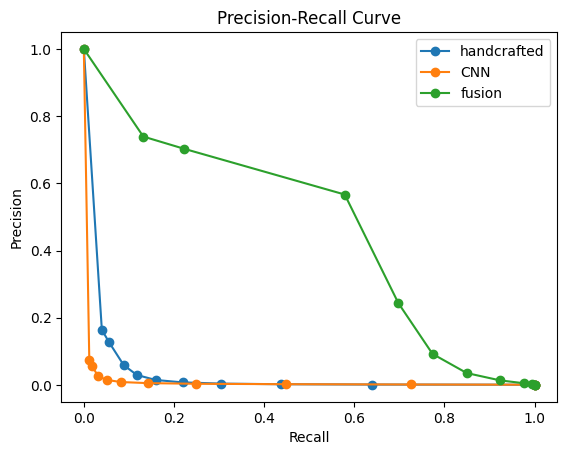

In [51]:
# calculate precision and recall for generating a
# precision recall graph for macro average
# to generate each point of the graph sweep the N parameter in a linspace from 3 to 13641
# (number of images in the dataset) make 30 points
# for each point calculate the precision and recall and then calculate the mean

# import tqdm
# import numpy as np
# N = np.logspace(0, np.log10(len(df)), 10)
# precision = {
#     "handcrafted": [],
#     "CNN": [],
#     "fusion": []
# }
# recall = {
#     "handcrafted": [],
#     "CNN": [],
#     "fusion": []
# }
# for N_ in tqdm.tqdm(N):
#     precision_aux = 0
#     recall_aux = 0
#     for i in range(len(df)):
#         row = df.iloc[i,:]
#         precision_, recall_ = precision_recall(df, matrix, row["image_name"], n_retrieved=int(N_))
#         precision_aux += precision_
#         recall_aux += recall_
#     precision["handcrafted"].append(precision_aux/len(df))
#     recall["handcrafted"].append(recall_aux/len(df))
#
#     precision_aux = 0
#     recall_aux = 0
#     for i in range(len(df)):
#         row = df.iloc[i,:]
#         precision_, recall_ = precision_recall(df, matrix_cnn, row["image_name"], n_retrieved=int(N_))
#         precision_aux += precision_
#         recall_aux += recall_
#     precision["CNN"].append(precision_aux/len(df))
#     recall["CNN"].append(recall_aux/len(df))
#
#     precision_aux = 0
#     recall_aux = 0
#     for i in range(len(df)):
#         row = df.iloc[i,:]
#         precision_, recall_ = precision_recall(df, matrix_fusion, row["image_name"], n_retrieved=int(N_))
#         precision_aux += precision_
#         recall_aux += recall_
#     precision["fusion"].append(precision_aux/len(df))
#     recall["fusion"].append(recall_aux/len(df))
#
#     #precision.append(precision_aux/len(df))
#     #recall.append(recall_aux/len(df))
#
# # # plot the precision recall graph with dots in each point
# # # add the points (1,0) and (0,1) to the graph
# # recall.append(1)
# # precision.append(0)
# # # add at the beginning of the list the point (1,0)
# # recall.insert(0, 0)
# # precision.insert(0, 1)
# for key in precision.keys():
#     recall[key].append(1)
#     precision[key].append(0)
#     recall[key].insert(0, 0)
#     precision[key].insert(0, 1)

# plt.plot(recall, precision, "o-")
# plt.xlabel("Recall")
# plt.ylabel("Precision")
# plt.title("Precision-Recall Curve")
# plt.show()

plt.plot(recall["handcrafted"], precision["handcrafted"], "o-", label="handcrafted")
plt.plot(recall["CNN"], precision["CNN"], "o-", label="CNN")
plt.plot(recall["fusion"], precision["fusion"], "o-", label="fusion")
plt.xlabel("Recall")
plt.ylabel("Precision")
plt.title("Precision-Recall Curve")
plt.legend()
plt.show()




In [ ]:
from src.CNN.CNN_utils import model, CNN_method
import os
from PIL import Image
def load_single(path):
    image = Image.open(os.path.join(path))
    return image

CNN_method(load_single(f'../dataset/total/{df["image_name"][0]}'), model)

def apply_cnn(image, CNN_method):
    try:
        return CNN_method(image, model)
    except:
        return np.zeros(4096)

#df["features_CNN"] = df["image_name"].apply(lambda x: apply_cnn(load_single(f'../dataset/total/{x}'), CNN_method), model)



In [171]:
!pip install memory-profiler

Defaulting to user installation because normal site-packages is not writeable
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 282.1/282.1 kB 1.3 MB/s eta 0:00:00a 0:00:01
  Consider adding this directory to PATH or, if you prefer to suppress this warning, use --no-warn-script-location.


In [11]:
from memory_profiler import memory_usage
import time

In [18]:
def measure_ram(function, *args, **kwargs):
    # Define a helper function that includes the memory profiling
    def wrapped_function():
        return function(*args, **kwargs)

    # Measure the memory usage of the function over time
    start_time = time.time()
    mem_usage = memory_usage(wrapped_function, interval=0.1, timeout=20)
    end_time = time.time()

    # Compute the average memory usage
    avg_ram = sum(mem_usage) / len(mem_usage)

    #print(f"Function executed in {end_time - start_time} seconds")
    #print(f"Average memory consumption: {avg_ram} MB")

    return avg_ram, end_time- start_time


In [22]:
# measure mean RAM complexity of the handcrafted method and the CNN method for the first 1000 images
# use query_image_normal so the computation o(n) is the same for both methods

# handcrafted method
def iterator_(query_image_normal, df, measure, feature_type):
    avg_ram = []
    time = []
    for i in tqdm.tqdm(np.random.randint(0, len(df), 10)):
        row = df.iloc[i,:]
        avg_ram_aux, time_aux = measure_ram(query_image_normal, df, row["image_name"], measure, feature_type)
        avg_ram.append(avg_ram_aux)
        time.append(time_aux)
    return sum(avg_ram)/len(avg_ram), sum(time)/len(time)

iterator_(query_image_normal, df, "euclidean", "histogram")


100%|██████████| 10/10 [01:32<00:00,  9.22s/it]


(1205.6674396054964, 9.223475933074951)

In [23]:
iterator_(query_image_normal, df, "euclidean", "CNN")


100%|██████████| 10/10 [01:32<00:00,  9.27s/it]


(1205.6796791888296, 9.27013294696808)

In [190]:
del matrix_cnn
del matrix